In [1]:
import os
from midi2audio import FluidSynth
from IPython.display import Audio
from music21 import *

In [2]:
from Melon.Harmonization.music_transformer import *
from Melon.Harmonization.multitask_transformer import *

In [3]:
midi_path =  Path('./data/midi/examples')
data_path = Path('./data/')

In [4]:
# Pretrained Model
pretrained_url = 'https://ashaw-midi-web-server.s3-us-west-2.amazonaws.com/pretrained/MultitaskSmallKeyC.pth'
pretrained_path = data_path/'pretrained'/Path(pretrained_url).name

# download if not
# download_url(pretrained_url, dest=pretrained_path)

In [6]:
empty_data = MusicDataBunch.from_files([], data_path, processors=[Midi2ItemProcessor()], ignore_empty=True)
empty_vocab = empty_data.vocab

In [ ]:
learner = multitask_model_learner(empty_data, pretrained_path=pretrained_path)

### Get Harmonization

In [26]:
def play_wav(stream):
    out_midi = stream.write('midi')
    out_wav = str(Path(out_midi).with_suffix('.wav'))
    FluidSynth("./fluid-soundfont-3.1/FluidR3_GM.sf2").midi_to_audio(out_midi, out_wav)
    return Audio(out_wav)

In [32]:
def get_harmonization(midi_file):
    midi_stream = file2stream(midi_file)
    midi_key = midi_stream.analyze('key.krumhanslschmuckler')
    transpose_interval = interval.Interval(midi_key.tonic, pitch.Pitch('C'))
    inverse_transpose_interval = interval.Interval(pitch.Pitch('C'), midi_key.tonic)
    midi_stream = midi_stream.transpose(transpose_interval)
    multitrack_item = MultitrackItem.from_stream(midi_stream, empty_vocab)
    melody = multitrack_item.melody
    empty_chords = MusicItem.empty(empty_vocab, seq_type=SEQType.Chords)
    pred_chord = learner.predict_s2s(input_item=melody, target_item=empty_chords)
    combined = MultitrackItem(melody, pred_chord)
    combined = combined
    return combined.stream.transpose(inverse_transpose_interval)
#     play_wav(combined.stream)

In [33]:
def save_midi(stream_object, filename):
    mf = midi.translate.streamToMidiFile(stream_object)
    mf.open(filename, 'wb')
    mf.write()
    mf.close()

In [8]:
os.listdir(midi_path)

['Levels - Avicii - Verse.mid',
 'Scary Monsters And Nice Sprites - Skrillex - Pre-Chorus.mid',
 'Can You Feel The Love Tonight - Elton John - Verse.mid',
 'Locked Out Of Heaven - Bruno Mars - Chorus.mid',
 'In The Hall Of The Mountain King - Edvard Grieg - Intro.mid',
 'Colors Of The Wind - Disney - Chorus.mid',
 'I Want You Back - Jackson 5 - Intro.mid',
 'Fuer Elise - Ludwig Van Beethoven - Verse.mid',
 'A Thousand Miles - Vanessa Carlton - Verse-And-Pre-Chorus.mid',
 'The Four Seasons Concerto No 4 Winter - Antonio Vivaldi - Instrumental.mid',
 'La Bamba - Ritchie Valen - Chorus.mid',
 'Just Give Me A Reason - Pink - Chorus.mid',
 'All I Want For Christmas Is You - Mariah Carey - Pre-Chorus-And-Chorus.mid',
 'Call Me Maybe - Carly Rae Jepsen - Chorus.mid',
 'Let It Go - Idina Menzel - Chorus.mid',
 'Canon In D Major - Johann Pachelbel - Chorus.mid',
 'Roses Ft Rozes - The Chainsmokers - Chorus.mid',
 'Where Is The Love - Black Eyed Peas - Chorus.mid',
 'Middle - Zedd - Pre-Chorus.m

In [9]:
f = midi_path/'Let It Go - Idina Menzel - Chorus.mid'

In [11]:
midi_stream = file2stream(f)

In [15]:
multitrack_item = MultitrackItem.from_stream(midi_stream, empty_vocab)

In [16]:
melody = multitrack_item.melody

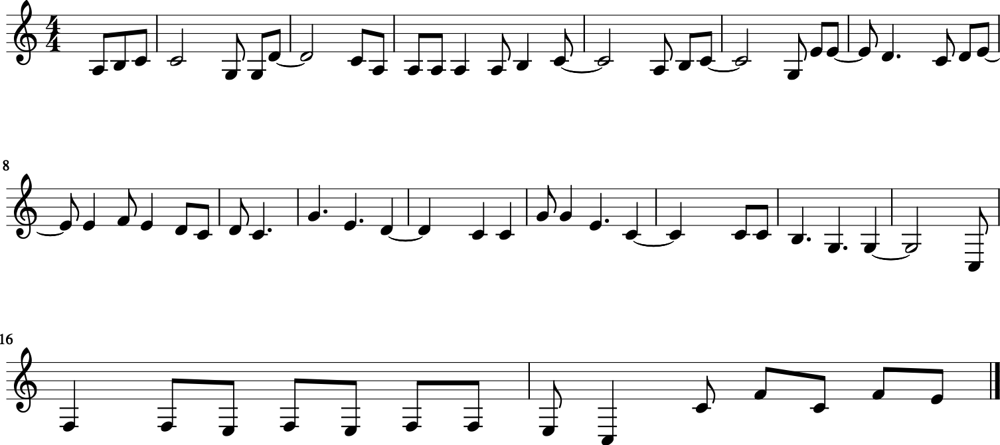

In [20]:
melody.stream.show()

In [27]:
play_wav(midi_stream)

In [42]:
output = get_harmonization(f)

<music21.interval.Interval P1>


Predicted past counter-part length. Returning early


In [ ]:
output.show()

In [43]:
play_wav(output)

In [44]:
save_midi(output, './output.mid')

In [35]:
from music21 import *

note1 = note.Note("C4")
note1.duration.type = 'half'
note1.lyric = 'hel-'
note2 = note.Note("F#4")
note3 = note.Note("B-2")

stream1 = stream.Stream()
stream1.id = 'some notes'
stream1.append(note1)
stream1.append(note2)
stream1.append(note3)

biggerStream = stream.Stream()
note2 = note.Note("D#5")
biggerStream.insert(0, note2)
biggerStream.append(stream1)

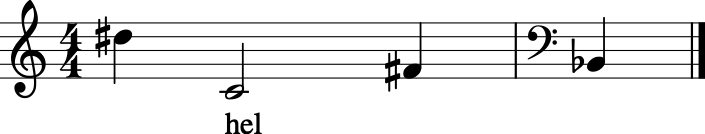

In [36]:
biggerStream.show()

In [37]:
play_wav(biggerStream)